In [2]:
import os
import pandas as pd

import plotly.express as px 
import plotly.graph_objects as go   

import seaborn as sns
import matplotlib.pyplot as plt

%matplotlib

Using matplotlib backend: module://matplotlib_inline.backend_inline


# Import des données

## Demandes de valeurs foncières diffusé par la DGFiP

Description

Ce jeu de données est dérivé du jeu de données Demandes de valeurs foncières diffusé par la DGFiP.

Il propose un format alternatif, normalisé et enrichi.

Améliorations par rapport aux fichiers bruts
CSV avec séparateur virgule et encodage UTF-8
Mise à jour avec les données de référence les plus récentes (COG 2020, PCI 2020)
Renommage des colonnes pour un traitement informatique plus facile
Suppression des colonnes non fournies dans la diffusion DVF
Jointure avec les tables fournies en documentation
Normalisation des valeurs décimales (point comme séparateur décimal)
Normalisation des codes postaux (5 caractères)
Normalisation des codes INSEE
Libellés de communes riches (accentués)
Normalisation des codes voie (FANTOIR) (4 caractères)
Création d'un identifiant de parcelle compatible avec les fichiers cadastraux proposés par Etalab
Date de mutation au format ISO-8601
Géocodage latitude/longitude à la parcelle en coordonnées WGS-84
Fourniture des fichiers au département ou à la commune

*   `id_mutation` : Identifiant de mutation (non stable, sert à grouper les lignes)
    
*   `date_mutation` : Date de la mutation au format ISO-8601 (YYYY-MM-DD)
    
*   `numero_disposition` : Numéro de disposition
    
*   `nature_mutation` : Nature de la mutation
    
*   `valeur_fonciere` : Valeur foncière (séparateur décimal = point)
    
*   `adresse_numero` : Numéro de l'adresse
    
*   `adresse_suffixe` : Suffixe du numéro de l'adresse (B, T, Q)
    
*   `adresse_code_voie` : Code FANTOIR de la voie (4 caractères)
    
*   `adresse_nom_voie` : Nom de la voie de l'adresse
    
*   `code_postal` : Code postal (5 caractères)
    
*   `code_commune` : Code commune INSEE (5 caractères)
    
*   `nom_commune` : Nom de la commune (accentué)
    
*   `ancien_code_commune` : Ancien code commune INSEE (si différent lors de la mutation)
    
*   `ancien_nom_commune` : Ancien nom de la commune (si différent lors de la mutation)
    
*   `code_departement` : Code département INSEE (2 ou 3 caractères)
    
*   `id_parcelle` : Identifiant de parcelle (14 caractères)
    
*   `ancien_id_parcelle` : Ancien identifiant de parcelle (si différent lors de la mutation)
    
*   `numero_volume` : Numéro de volume
    
*   `lot_1_numero` : Numéro du lot 1
    
*   `lot_1_surface_carrez` : Surface Carrez du lot 1
    
*   `lot_2_numero` : Numéro du lot 2
    
*   `lot_2_surface_carrez` : Surface Carrez du lot 2
    
*   `lot_3_numero` : Numéro du lot 3
    
*   `lot_3_surface_carrez` : Surface Carrez du lot 3
    
*   `lot_4_numero` : Numéro du lot 4
    
*   `lot_4_surface_carrez` : Surface Carrez du lot 4
    
*   `lot_5_numero` : Numéro du lot 5
    
*   `lot_5_surface_carrez` : Surface Carrez du lot 5
    
*   `nombre_lots` : Nombre de lots
    
*   `code_type_local` : Code de type de local
    
*   `type_local` : Libellé du type de local
    
*   `surface_reelle_bati` : Surface réelle du bâti
    
*   `nombre_pieces_principales` : Nombre de pièces principales
    
*   `code_nature_culture` : Code de nature de culture
    
*   `nature_culture` : Libellé de nature de culture
    
*   `code_nature_culture_speciale` : Code de nature de culture spéciale
    
*   `nature_culture_speciale` : Libellé de nature de culture spéciale
    
*   `surface_terrain` : Surface du terrain
    
*   `longitude` : Longitude du centre de la parcelle concernée (WGS-84)
    
*   `latitude` : Latitude du centre de la parcelle concernée (WGS-84)

## Année 2020 à 2024

In [2]:
folder_path = '../data/raw/DVF'
output_file = os.path.join(folder_path, 'merged_dvf_data.csv')

chunksize = 100000  # Number of rows per chunk
chunks = pd.read_csv(output_file, sep=',', chunksize=chunksize, index_col=None, low_memory=False)

# Process chunks
df_dvf = pd.concat(chunk for chunk in chunks)

df_dvf.head()

,id_mutation,date_mutation,numero_disposition,nature_mutation,valeur_fonciere,adresse_numero,adresse_suffixe,adresse_nom_voie,adresse_code_voie,code_postal,...,type_local,surface_reelle_bati,nombre_pieces_principales,code_nature_culture,nature_culture,code_nature_culture_speciale,nature_culture_speciale,surface_terrain,longitude,latitude
0,2020-1,2020-01-07,1.0,Vente,8000.0,NaN,NaN,FORTUNAT,B063,1250.0,...,NaN,NaN,NaN,T,terres,NaN,NaN,1061.0,5.323532,46.171941
1,2020-2,2020-01-02,1.0,Vente,2175.0,NaN,NaN,TERRES DES CINQ SAULES,B124,1290.0,...,NaN,NaN,NaN,BT,taillis simples,NaN,NaN,85.0,4.893454,46.251858
2,2020-2,2020-01-02,1.0,Vente,2175.0,NaN,NaN,BOIS DU CHAMP RION,B006,1290.0,...,NaN,NaN,NaN,T,terres,NaN,NaN,1115.0,4.900210,46.235277
3,2020-2,2020-01-02,1.0,Vente,2175.0,NaN,NaN,EN COROBERT,B025,1290.0,...,NaN,NaN,NaN,T,terres,NaN,NaN,1940.0,4.882112,46.246554
4,2020-2,2020-01-02,1.0,Vente,2175.0,NaN,NaN,TERRES DES CINQ SAULES,B124,1290.0,...,NaN,NaN,NaN,T,terres,NaN,NaN,1148.0,4.894481,46.251841


## Valeurs manquantes :

In [3]:
missing_data_percentage = df_dvf.isna().sum()*100/len(df_dvf)
missing_value_percentage = pd.DataFrame({'column_name': df_dvf.columns,
                                 'percent_missing': missing_data_percentage,'dtypes':df_dvf.dtypes}).sort_values(by='percent_missing', ascending=False)
display(missing_value_percentage)

,column_name,percent_missing,dtypes
ancien_id_parcelle,ancien_id_parcelle,99.999978,object
ancien_code_commune,ancien_code_commune,99.998513,float64
ancien_nom_commune,ancien_nom_commune,99.998513,object
lot5_surface_carrez,lot5_surface_carrez,99.973486,float64
lot4_surface_carrez,lot4_surface_carrez,99.925614,float64
lot5_numero,lot5_numero,99.778745,object
numero_volume,numero_volume,99.770450,object
lot3_surface_carrez,lot3_surface_carrez,99.693474,float64
lot4_numero,lot4_numero,99.486674,object
lot3_numero,lot3_numero,98.398885,object


# Visualisation des NAN

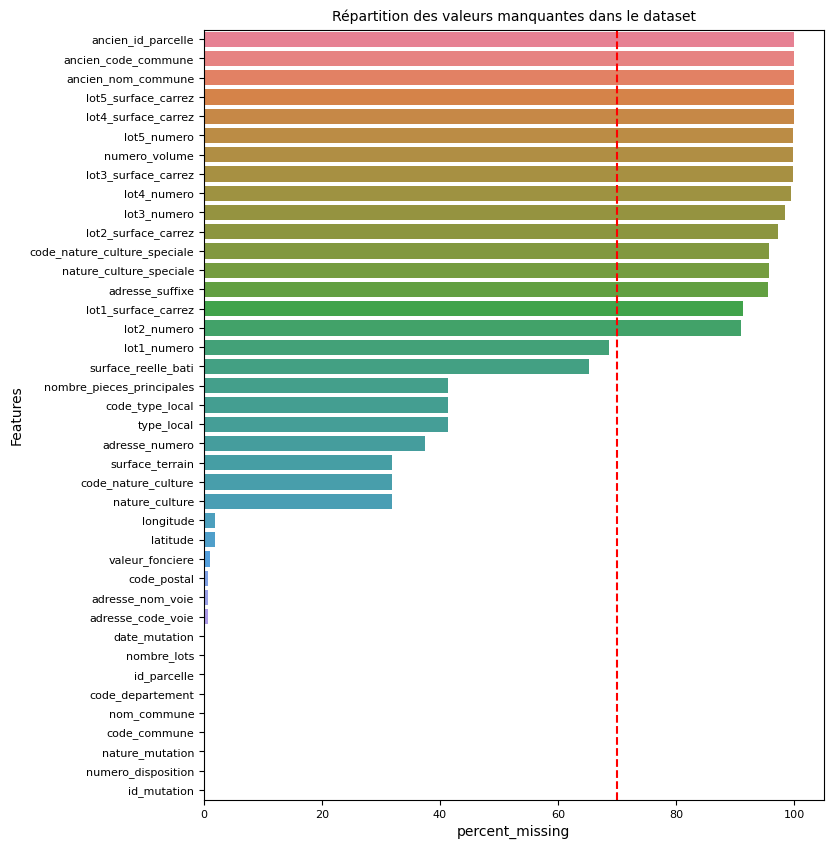

In [4]:
plt.figure(figsize=(8, 10)) 

sns.barplot(y = missing_value_percentage.column_name, 
            x = missing_value_percentage.percent_missing, 
            hue = missing_value_percentage.column_name, 
            order = missing_value_percentage.column_name)

# Add a vertical line at x=50 (adjust as needed)
plt.axvline(x=70, color='red', linestyle='--', label='Threshold (70%)')

plt.title('Répartition des valeurs manquantes dans le dataset', fontsize=10)
plt.xticks(fontsize=8)  
plt.yticks(fontsize=8)  
plt.ylabel('Features');

### Nom des variables dont le pourcentage de valeurs manquantes est inférieur à 70 %

> Dans notre dataset, on constate que la grande diversité des variables. Cette grande diversité nous permet de faire le choix d'éliminer certaines variables qui représentent don peu d'enjeux dans la prédiction de notre modèle, par exemple l'ancien code code commune, ou le numéro de volume. Arbitrairement, le seuil de valeurs manquantes que nous choisirons sera de 70 % de valeurs manquantes dans la variable.

In [10]:
missing_values = df_dvf.isnull().mean()
variables_to_keep = missing_values[missing_values <= 0.70].index

print(variables_to_keep)

Index(['id_mutation', 'date_mutation', 'numero_disposition', 'nature_mutation',
       'valeur_fonciere', 'adresse_numero', 'adresse_nom_voie',
       'adresse_code_voie', 'code_postal', 'code_commune', 'nom_commune',
       'code_departement', 'id_parcelle', 'lot1_numero', 'nombre_lots',
       'code_type_local', 'type_local', 'surface_reelle_bati',
       'nombre_pieces_principales', 'code_nature_culture', 'nature_culture',
       'surface_terrain', 'longitude', 'latitude'],
      dtype='object')


### Mise à jour du dataset avec seulement les variables à garder.
> cast des variables catégorielles encodée en float

In [11]:
# Convert the date columns to datetime format
df_dvf["date_mutation"] = pd.to_datetime(df_dvf["date_mutation"], format='%Y-%m-%d')
# Convert the "code_postal" column to "str" format
#Safely convert 'code_postal' to strings
df_dvf["code_postal"] = df_dvf["code_postal"].astype('str').str.replace('.0', '', regex=False)
# Convert the "code_departement" column to "str" format
df_dvf["code_departement"] = df_dvf["code_departement"].astype('str').str.replace('.0', '', regex=False)

# Convert the "adresse_numero" column to "str" format
df_dvf["adresse_numero"] = df_dvf["adresse_numero"].astype(str)

# Save the cleaned data
df_dvf = df_dvf[variables_to_keep]

folder_path_clean = '../data/processed/DVF'
output_file_clean = os.path.join(folder_path_clean, 'merged_dvf_data_clean.csv')
df_dvf.to_csv(output_file_clean, index=False)

df_dvf.info(show_counts=True)


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18227801 entries, 0 to 18227800
Data columns (total 24 columns):
 #   Column                     Non-Null Count     Dtype         
---  ------                     --------------     -----         
 0   id_mutation                18227801 non-null  object        
 1   date_mutation              18227637 non-null  datetime64[ns]
 2   numero_disposition         18227637 non-null  float64       
 3   nature_mutation            18227637 non-null  object        
 4   valeur_fonciere            18051468 non-null  float64       
 5   adresse_numero             18227801 non-null  object        
 6   adresse_nom_voie           18090847 non-null  object        
 7   adresse_code_voie          18091623 non-null  object        
 8   code_postal                18227801 non-null  object        
 9   code_commune               18227637 non-null  object        
 10  nom_commune                18227637 non-null  object        
 11  code_departement      

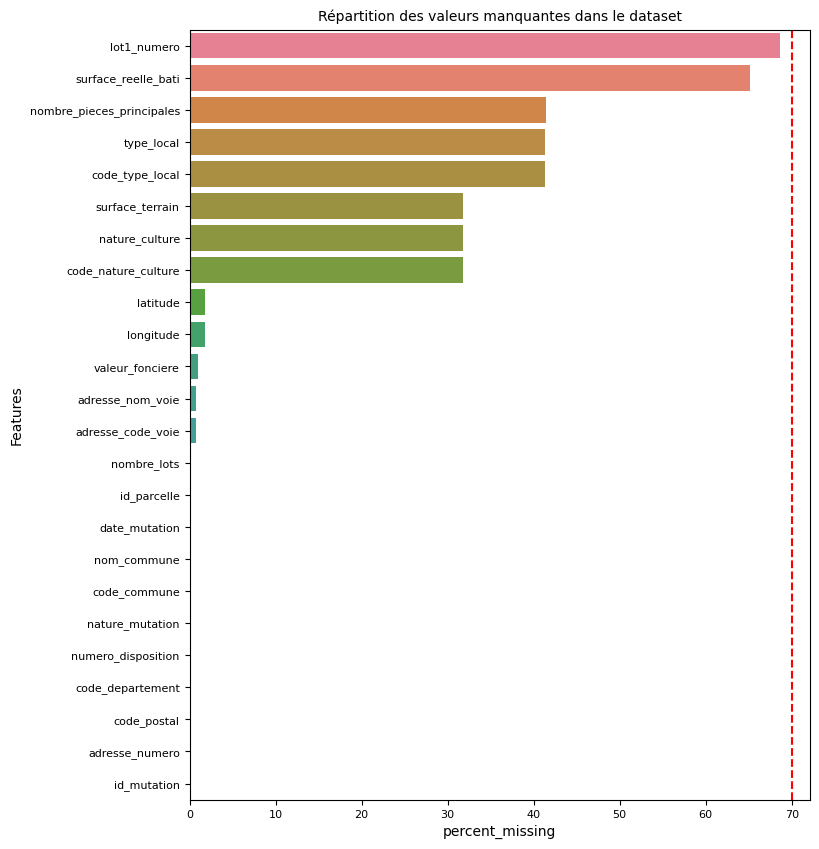

In [22]:
missing_data_percentage = df_dvf.isna().sum()*100/len(df_dvf)
missing_value_percentage = pd.DataFrame({'column_name': df_dvf.columns,
                                         'percent_missing': missing_data_percentage
                                         }).sort_values(by='percent_missing', ascending=False)

plt.figure(figsize=(8, 10)) 

sns.barplot(y = missing_value_percentage.column_name, 
            x = missing_value_percentage.percent_missing, 
            hue = missing_value_percentage.column_name, 
            order = missing_value_percentage.column_name)

# Add a vertical line at x=50 (adjust as needed)
plt.axvline(x=70, color='red', linestyle='--', label='Threshold (70%)')

plt.title('Répartition des valeurs manquantes dans le dataset', fontsize=10)
plt.xticks(fontsize=8)  
plt.yticks(fontsize=8)  
plt.ylabel('Features');

# Dataviz

### Modalités des variables catégorielles ( moins de 10 modalités )

In [24]:
# Combine object and numerical columns
columns_to_check = df_dvf.select_dtypes(include=['object', 'int64', 'float64']).columns

columns_checked = []

# Iterate through each column and filter unique values with less than 10, excluding NaN
for col in columns_to_check:
    unique_values = df_dvf[col].dropna().unique()  # Exclude NaN values
    if len(unique_values) < 10:
        print(f"Column: {col}")
        print(f"Unique Values: {unique_values}")
        print("-" * 50)
        columns_checked.append(col)


Column: nature_mutation
Unique Values: ['Vente' 'Vente terrain à bâtir' 'Echange'
 "Vente en l'état futur d'achèvement" 'Adjudication' 'Expropriation']
--------------------------------------------------
Column: code_type_local
Unique Values: [1. 2. 3. 4.]
--------------------------------------------------
Column: type_local
Unique Values: ['Maison' 'Appartement' 'Dépendance'
 'Local industriel. commercial ou assimilé']
--------------------------------------------------


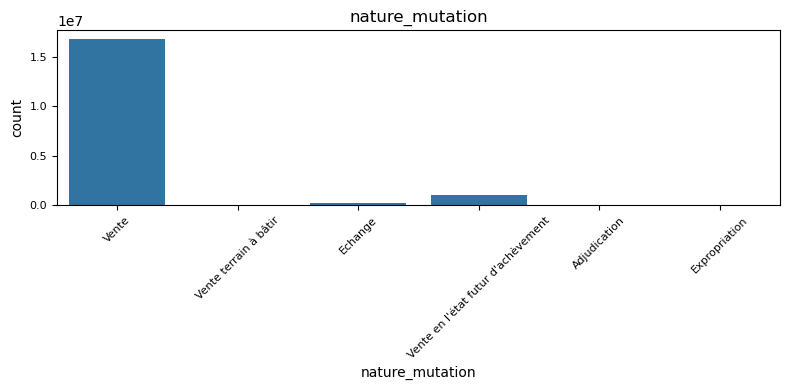

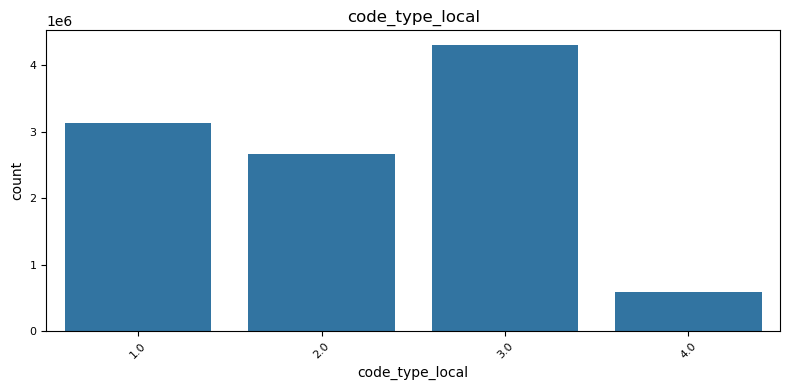

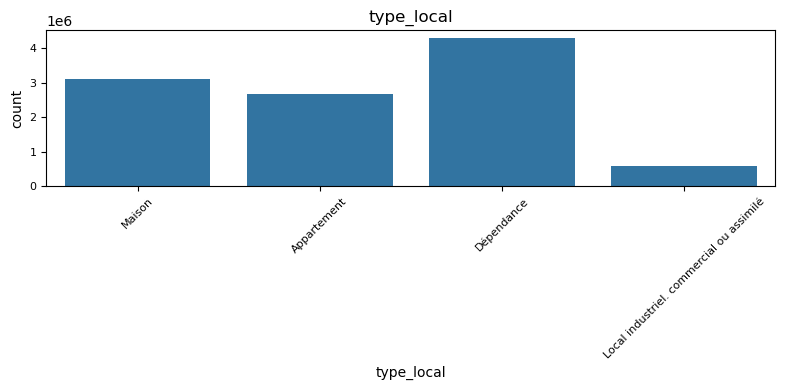

In [23]:
for var_to_viz in columns_checked:
    plt.figure(figsize=(8, 4))
    sns.countplot(data=df_dvf, x=var_to_viz)
    plt.title(f'{var_to_viz}')
    plt.xticks(rotation=45, fontsize=8)
    plt.yticks(fontsize=8)
    plt.tight_layout()
    plt.show()

Il semblerait que la variable code_type_local décrive la même chose que la variable type_local

### Modalités des autres variables ( plus de 10 modalités )

In [25]:
columns_investigated = columns_checked
df_dvf_remaining = df_dvf.drop(columns_investigated,axis=1)

columns_to_check = df_dvf_remaining.select_dtypes(include=['object']).columns
columns_checked = []

# Iterate through each column and filter unique values with less than 10, excluding NaN
for col in columns_to_check:
    unique_values = df_dvf_remaining[col].dropna().unique()  # Exclude NaN values
    if len(unique_values) > 10:
        print(f"Column: {col}")
        print(f"Unique Values: {unique_values}")
        print("-" * 50)
        columns_checked.append(col)

Column: id_mutation
Unique Values: ['2020-1' '2020-2' '2020-3' ... '2024-556070' '2024-556071' '2024-556072']
--------------------------------------------------
Column: adresse_numero
Unique Values: ['nan' '5367.0' '31.0' ... '7818.0' '7413.0' '8481.0']
--------------------------------------------------
Column: adresse_nom_voie
Unique Values: ['FORTUNAT' 'TERRES DES CINQ SAULES' 'BOIS DU CHAMP RION' ...
 'HAM BOULAINVILLIERS' 'PL DE LA PORTE DE SAINT CLOUD' 'PAS SALARNIER']
--------------------------------------------------
Column: adresse_code_voie
Unique Values: ['B063' 'B124' 'B006' ... 'A989' '9993' '8367']
--------------------------------------------------
Column: code_postal
Unique Values: ['1250' '1290' '1960' ... '64023' '97316' '78129']
--------------------------------------------------
Column: code_commune
Unique Values: [1072 1203 1289 ... 30246 65134 80480]
--------------------------------------------------
Column: nom_commune
Unique Values: ['Ceyzériat' 'Laiz' 'Péronnas' .

### Distribution des variables quantitatives

In [26]:
df_dvf_remaining = df_dvf_remaining.drop(columns_checked,axis=1)
df_dvf_remaining.describe()

,date_mutation,numero_disposition,valeur_fonciere,nombre_lots,surface_reelle_bati,nombre_pieces_principales,surface_terrain,longitude,latitude
count,18227637,1.822764e+07,1.805147e+07,1.822764e+07,6.353213e+06,1.068510e+07,1.242711e+07,1.789821e+07,1.789821e+07
mean,2022-03-31 00:26:59.226454272,1.227650e+00,1.581049e+06,4.322171e-01,1.150249e+02,1.877127e+00,2.839612e+03,2.350950e+00,4.609398e+01
min,2020-01-01 00:00:00,1.000000e+00,1.000000e-02,0.000000e+00,1.000000e+00,0.000000e+00,1.000000e+00,-6.315107e+01,-2.138654e+01
25%,2021-04-12 00:00:00,1.000000e+00,6.900000e+04,0.000000e+00,5.000000e+01,0.000000e+00,2.450000e+02,3.158320e-01,4.466177e+01
50%,2022-03-22 00:00:00,1.000000e+00,1.640000e+05,0.000000e+00,7.500000e+01,1.000000e+00,6.200000e+02,2.362365e+00,4.671384e+01
75%,2023-03-23 00:00:00,1.000000e+00,3.013195e+05,1.000000e+00,1.050000e+02,4.000000e+00,1.773000e+03,4.640111e+00,4.866038e+01
max,2024-06-30 00:00:00,1.246000e+03,1.415000e+10,2.360000e+02,4.500000e+05,1.090000e+02,1.072309e+07,5.583003e+01,5.108645e+01
std,NaN,8.083835e+00,1.758645e+07,8.379340e-01,7.810542e+02,2.093780e+00,1.408767e+04,6.391547e+00,5.940038e+00


In [27]:
for var_to_viz in df_dvf_remaining.columns:
    print(f"Column: {var_to_viz}")

Column: date_mutation
Column: numero_disposition
Column: valeur_fonciere
Column: nombre_lots
Column: surface_reelle_bati
Column: nombre_pieces_principales
Column: surface_terrain
Column: longitude
Column: latitude


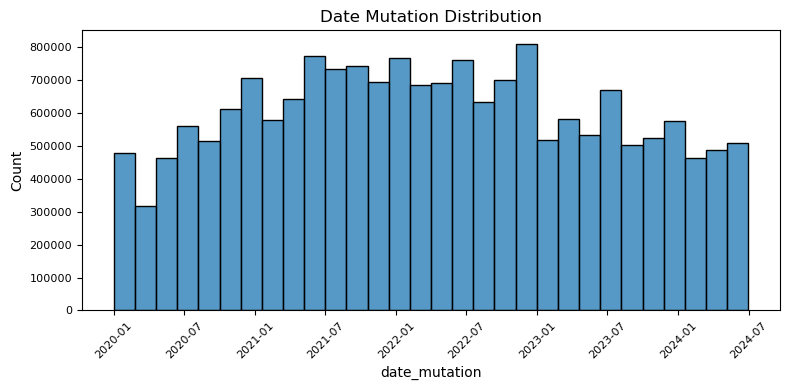

In [30]:
plt.figure(figsize=(8, 4))
sns.histplot(data=df_dvf_remaining, x='date_mutation', bins=30)
plt.title('Date Mutation Distribution')
plt.xticks(rotation=45, fontsize=8)
plt.yticks(fontsize=8)
plt.tight_layout()
plt.show()

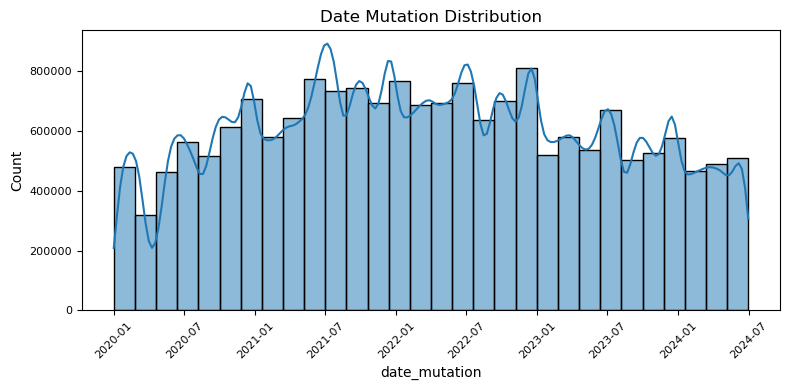

In [28]:
plt.figure(figsize=(8, 4))
sns.histplot(data=df_dvf_remaining, x='date_mutation', bins=30, kde=True)
plt.title('Date Mutation Distribution')
plt.xticks(rotation=45, fontsize=8)
plt.yticks(fontsize=8)
plt.tight_layout()
plt.show()

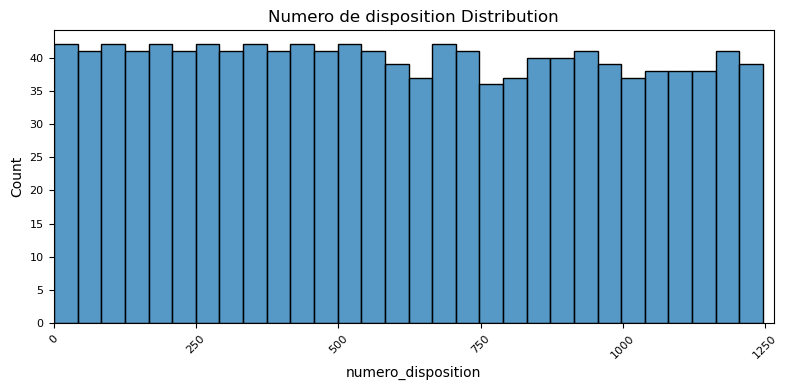

In [59]:
import numpy as np

num_dispositions = df_dvf_remaining['numero_disposition'].dropna().unique()
temp = pd.DataFrame(num_dispositions, columns=['numero_disposition'])

plt.figure(figsize=(8, 4))
sns.histplot(data=temp, x='numero_disposition', bins=30)
plt.title('Numero de disposition Distribution')

# Set x-axis ticks with a specific scale (e.g., every 500,000 units)
tick_positions_x = np.arange(0, 1266, 250)
plt.xticks(tick_positions_x, rotation=45, fontsize=8)
plt.xlim(0, 1265)

plt.xticks(rotation=45, fontsize=8)
plt.yticks(fontsize=8)
plt.tight_layout()
plt.show()

Il semblerait qur le numéro de disposition soit d'avantage une variable catégorielle et ordinale

> Un Id de mutation peut porter sur l'acquision d'un bien comprenant plusieurs lot (maison, terrain, dépendance, etc) .
>> Il nous faut les regrouper afin d'éviter les comptages inutiles sur la valeur foncière d'un bien dans son ensemble

In [61]:
# Group by 'valeur_fonciere' without aggregation
grouped = df_dvf.groupby('valeur_fonciere')

# Convert the grouped object back to a DataFrame
grouped_df = pd.concat([group for _, group in grouped])

# Save the cleaned data
df_dvf = grouped_df
folder_path_clean = '../data/processed/DVF'
output_file_clean = os.path.join(folder_path_clean, 'merged_dvf_data_clean.csv')
df_dvf.to_csv(output_file_clean, index=False)

grouped_df.info(show_counts=True)

<class 'pandas.core.frame.DataFrame'>
Index: 18051468 entries, 1313399 to 4012464
Data columns (total 24 columns):
 #   Column                     Non-Null Count     Dtype         
---  ------                     --------------     -----         
 0   id_mutation                18051468 non-null  object        
 1   date_mutation              18051468 non-null  datetime64[ns]
 2   numero_disposition         18051468 non-null  float64       
 3   nature_mutation            18051468 non-null  object        
 4   valeur_fonciere            18051468 non-null  float64       
 5   adresse_numero             18051468 non-null  object        
 6   adresse_nom_voie           17915122 non-null  object        
 7   adresse_code_voie          17915894 non-null  object        
 8   code_postal                18051468 non-null  object        
 9   code_commune               18051468 non-null  object        
 10  nom_commune                18051468 non-null  object        
 11  code_departement      

Le regroupement nous a permis de retirer 176 333 lignes sur 18 Millions

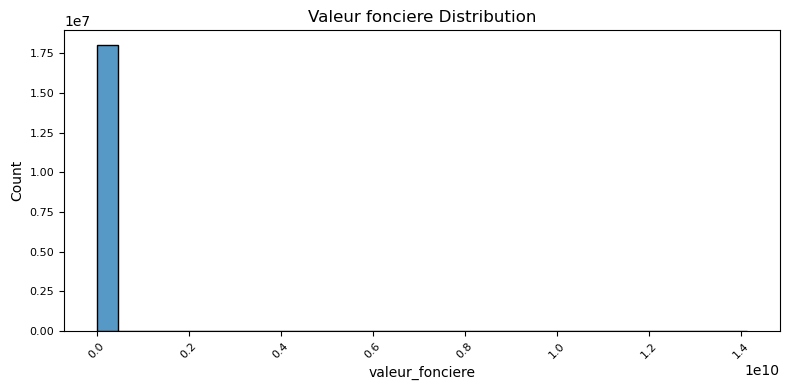

In [75]:
plt.figure(figsize=(8, 4))
sns.histplot(data=grouped_df, x='valeur_fonciere', bins=30)
plt.title('Valeur fonciere Distribution')
plt.xticks(rotation=45, fontsize=8)
plt.yticks(fontsize=8)
plt.tight_layout()
plt.show()

> Il est problable qu'il y ait eu un problème de collectecte et la présence d'outliners

In [110]:
# Calculate the IQR for 'valeur_fonciere'
Q1 = grouped_df["valeur_fonciere"].quantile(0.25)  # First quartile (25th percentile)
Q3 = grouped_df["valeur_fonciere"].quantile(0.75)  # Third quartile (75th percentile)
IQR = Q3 - Q1  # Interquartile range

# Define the lower and upper bounds for outliers
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

# Filter the DataFrame to remove outliers
grouped_df = grouped_df[(grouped_df["valeur_fonciere"] >= lower_bound) & (grouped_df["valeur_fonciere"] <= upper_bound)]

# Save the cleaned data
df_dvf = grouped_df
folder_path_clean = '../data/processed/DVF'
output_file_clean = os.path.join(folder_path_clean, 'merged_dvf_data_clean.csv')
df_dvf.to_csv(output_file_clean, index=False)

grouped_df.info(show_counts=True)

<class 'pandas.core.frame.DataFrame'>
Index: 15933179 entries, 1313399 to 18224256
Data columns (total 24 columns):
 #   Column                     Non-Null Count     Dtype         
---  ------                     --------------     -----         
 0   id_mutation                15933179 non-null  object        
 1   date_mutation              15933179 non-null  datetime64[ns]
 2   numero_disposition         15933179 non-null  float64       
 3   nature_mutation            15933179 non-null  object        
 4   valeur_fonciere            15933179 non-null  float64       
 5   adresse_numero             15933179 non-null  object        
 6   adresse_nom_voie           15834488 non-null  object        
 7   adresse_code_voie          15835197 non-null  object        
 8   code_postal                15933179 non-null  object        
 9   code_commune               15933179 non-null  object        
 10  nom_commune                15933179 non-null  object        
 11  code_departement     

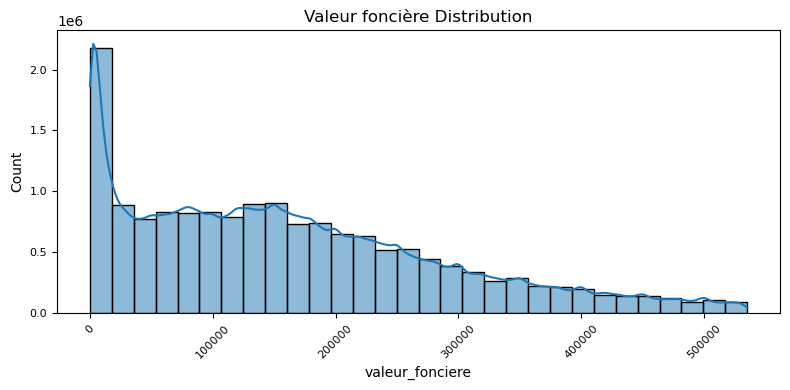

In [111]:
plt.figure(figsize=(8, 4))
sns.histplot(data=grouped_df, x='valeur_fonciere', bins=30, kde=True)
plt.title('Valeur foncière Distribution')
plt.xticks(rotation=45, fontsize=8)
plt.yticks(fontsize=8)
plt.tight_layout()
plt.show()

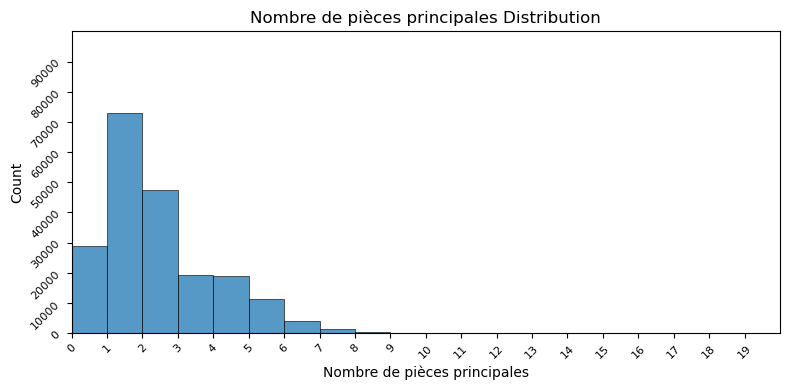

In [114]:
import numpy as np
rooms = grouped_df.groupby('valeur_fonciere').agg({'nombre_pieces_principales': 'mean'})

# Reset index to convert the grouped DataFrame back to a regular DataFrame

plt.figure(figsize=(8, 4))
sns.histplot(data=rooms, x='nombre_pieces_principales', bins=95)

# Set x-axis ticks with a specific scale (e.g., every 500,000 units)
tick_positions = np.arange(0, 20, 1)
plt.xticks(tick_positions, rotation=45, fontsize=8)
plt.xlim(0, 20)

# Set y-axis ticks with a specific scale (e.g., every 500,000 units)
tick_positions_y = np.arange(0, 100000, 10000)
plt.yticks(tick_positions_y, rotation=45, fontsize=8)
plt.ylim(0, 100000)

# Add title and labels
plt.title('Nombre de pièces principales Distribution', fontsize=12)
plt.xlabel('Nombre de pièces principales', fontsize=10)
plt.ylabel('Count', fontsize=10)

# Show the plot
plt.tight_layout()
plt.show()

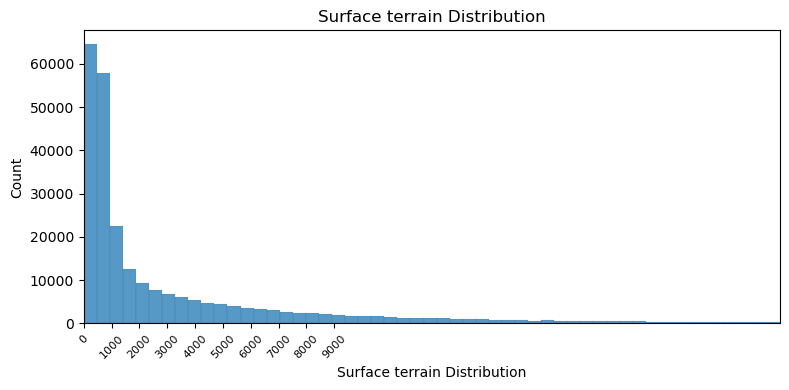

In [115]:
import numpy as np
land = grouped_df.groupby('valeur_fonciere').agg({'surface_terrain': 'mean'})

# Reset index to convert the grouped DataFrame back to a regular DataFrame

plt.figure(figsize=(8, 4))
sns.histplot(data=land, x='surface_terrain', bins=1000)

# Set x-axis ticks with a specific scale (e.g., every 500,000 units)
tick_positions = np.arange(0, 10000, 1000)
plt.xticks(tick_positions, rotation=45, fontsize=8)
plt.xlim(0, 25000)

# Add title and labels
plt.title('Surface terrain Distribution', fontsize=12)
plt.xlabel('Surface terrain Distribution', fontsize=10)
plt.ylabel('Count', fontsize=10)

# Show the plot
plt.tight_layout()
plt.show()

# Lecture des données de géolocalisation

> Pour des raison de performance de plotly express, obligé d'afficher sur un échantillon de 1%.

> Au delà de cette limite, l'affichage crashe car trop de points

In [1]:
import plotly.express as px
import pandas as pd
import os

# Load the cleaned data without needing the first part of the code again
folder_path = '../data/processed/DVF'
output_file = os.path.join(folder_path, 'merged_dvf_data_clean.csv')

chunksize = 100000  # Number of rows per chunk
chunks = pd.read_csv(output_file, sep=',', chunksize=chunksize, index_col=None, low_memory=False)

# Process chunks
df_dvf = pd.concat(chunk for chunk in chunks)

# Reduce dataset size by sampling (e.g., 10% of the data)
df_sampled = df_dvf.sample(frac=0.01, random_state=42)

fig = px.scatter_map(df_sampled, 
                    lat = "latitude", 
                    lon = "longitude", 
                    color = "nature_mutation", 
                    height = 700, 
                    width = 900,
                    hover_name = "valeur_fonciere", 
                    hover_data = "valeur_fonciere", 
                    size = "valeur_fonciere", 
                    size_max = 15, 
                    zoom = 6,
                    center = {"lat": 48.866667, "lon": 2.333333},
                )
fig.update_geos(projection_type="natural earth")
fig.update_layout(title="Scatter Map Prices", title_x=0.5, title_y=0.95)
fig.show()